In [1]:
using LinearAlgebra
using Distributions
using StatsPlots
default(fmt=:png)
using Random

function sim(x, β, dist, d; L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    ginvA = (A'A)\A'
    utmp = [zeros(n) for _ in 1:Threads.nthreads()]
    y = [zeros(n) for _ in 1:Threads.nthreads()]
    b = [zeros(r) for _ in 1:Threads.nthreads()]
    β̂ = zeros(r, L)
    Threads.@threads for i in 1:L
        tid = Threads.threadid()
        u = rand!(dist, utmp[tid])
        @. y[tid] = y0 + u
        mul!(b[tid], ginvA, y[tid])
        β̂[:, i] .= b[tid]
    end
    β̂
end

rd(x; sigdigits=4) = round(x; sigdigits)

function plot_sim(x, β, dist, d; L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    
    PP = []
    
    @show dist mean(dist) std(dist)
    println()
    P = plot(dist; label="residual dist.")
    push!(PP, P)
    
    u = rand(dist, n)
    y = y0 + u
    b = A \ y
    f_lse(x) = evalpoly(x, b)
    P = scatter(x, y; label="example of data", msc=:auto, ms=3)
    plot!(f, extrema(x)...; label="true")
    plot!(f_lse, extrema(x)...; label="LSE", ls=:dash)
    push!(PP, P)
    
    β̂ = sim(x, β, dist, d; L)

    @show β
    @show meanβ̂ = rd.(vec(mean(β̂; dims=2)))
    @show rd.(std(dist) * .√diag(inv(A'A)))
    @show stdβ̂ = rd.(vec(std(β̂; dims=2)))
    println()
    
    for i in 1:r
        P = stephist(β̂[i, :]; norm=true, label="betahat[$(i)]")
        plot!(Normal(meanβ̂[i], stdβ̂[i]); label="normal approx.", ls=:dash)
        push!(PP, P)
    end

    @show n d
    
    h = 1 + (r+1) ÷ 2
    plot(PP...; size=(800, 250h), layout=(h, 2))
end

expeczero(dist) = dist - mean(dist)
standardized(dist) = (dist - mean(dist)) / std(dist)

standardized (generic function with 1 method)

In [2]:
ECDF(A, x) = count(≤(x), A)/length(A)

function sim_pval(x, β, dist, d; β₀ = β, L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    ginvA = (A'A)\A'
    sqrtdiaginvAA = .√diag(inv(A'A))
    nth = Threads.nthreads()
    utmp = [zeros(n) for _ in 1:nth]
    y = [zeros(n) for _ in 1:nth]
    b = [zeros(r) for _ in 1:nth]
    β̂ = zeros(r, L)
    uhat = [zeros(n) for _ in 1:nth]
    SEhat = zeros(r, L)
    T = zeros(r, L)
    pval = zeros(r, L)
    #Threads.@threads 
    for i in 1:L
        tid = Threads.threadid()
        u = rand!(dist, utmp[tid])
        @. y[tid] = y0 + u
        mul!(b[tid], ginvA, y[tid])
        @. β̂[:, i] = b[tid]
        @. uhat[tid] = y[tid] - evalpoly(x, (b[tid],))
        shat = √(dot(uhat[tid], uhat[tid])/(n - r))
        @. SEhat[:, i] = shat * sqrtdiaginvAA
        @. T[:, i] = (b[tid] - β₀) / @view(SEhat[:, i])
        @. pval[:, i] = 2ccdf(TDist(n-r), abs(@view(T[:, i])))
    end
    β̂, SEhat, T, pval
end

function plot_sim_pval(x, β, dist, d; β₀ = β, α = 0.05, L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    
    PP = []
    
    @show dist mean(dist) std(dist)
    println()
    P = plot(dist; label="residual dist.")
    push!(PP, P)
    
    u = rand(dist, n)
    y = y0 + u
    b = A \ y
    f_lse(x) = evalpoly(x, b)
    P = scatter(x, y; label="example of data", msc=:auto, ms=3)
    plot!(f, extrema(x)...; label="true")
    plot!(f_lse, extrema(x)...; label="LSE", ls=:dash)
    push!(PP, P)
     
    β̂, SEhat, T, pval = sim_pval(x, β, dist, d; β₀, L)

    @show β
    @show meanβ̂ = rd.(vec(mean(β̂; dims=2)))
    @show rd.(std(dist) * .√diag(inv(A'A)))
    @show stdβ̂ = rd.(vec(std(β̂; dims=2)))
    println()
    
    αs = exp.(range(log(0.002), log(1), 400))
    _tick = Any[0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1]
    xtick = ytick = (_tick, string.(_tick))
    
    @show n d
    @show β β₀
    @show α
    for i in 1:r
        @show ECDF(pval[i, :], α)
        P = plot(αs, α -> ECDF(pval[i, :], α); label="betahat[$i]")
        plot!(αs, identity; label="", ls=:dash)
        plot!(αs, x -> 1.2x; label="", ls=:dot, c=:black, alpha=0.4)
        plot!(αs, x -> 0.8x; label="", ls=:dot, c=:black, alpha=0.4)
        plot!(; xscale=:log10, yscale=:log10, xtick, ytick, xrotation=90)
        plot!(xguide="α", yguide="P(P-value ≤ α)")
        push!(PP, P)
    end
    
    h = 1 + (r+1) ÷ 2
    plot(PP...; size=(640, 320h), layout=(h, 2))
    plot!(leftmargin=4Plots.mm)
    plot!(tickfontsize=6)
end

plot_sim_pval (generic function with 1 method)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0002633, 0.9999, 0.0001798, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2392, 0.3213, 0.1101, 0.1025]

n = 10
d = 3


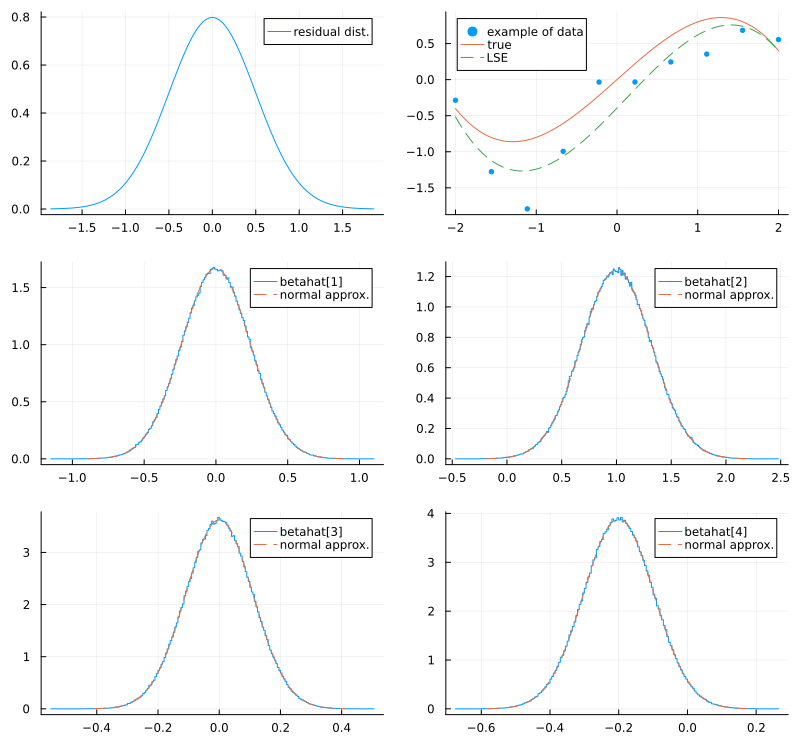

In [3]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 3
plot_sim(x, β, dist, d)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0003637, 1.0, -0.0002478, -0.2003, 3.727e-5, 8.462e-5]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.3043, 0.6021, 0.419, 0.5367, 0.09984, 0.1032]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.3043, 0.602, 0.4189, 0.5367, 0.09977, 0.1033]

n = 10
d = 5


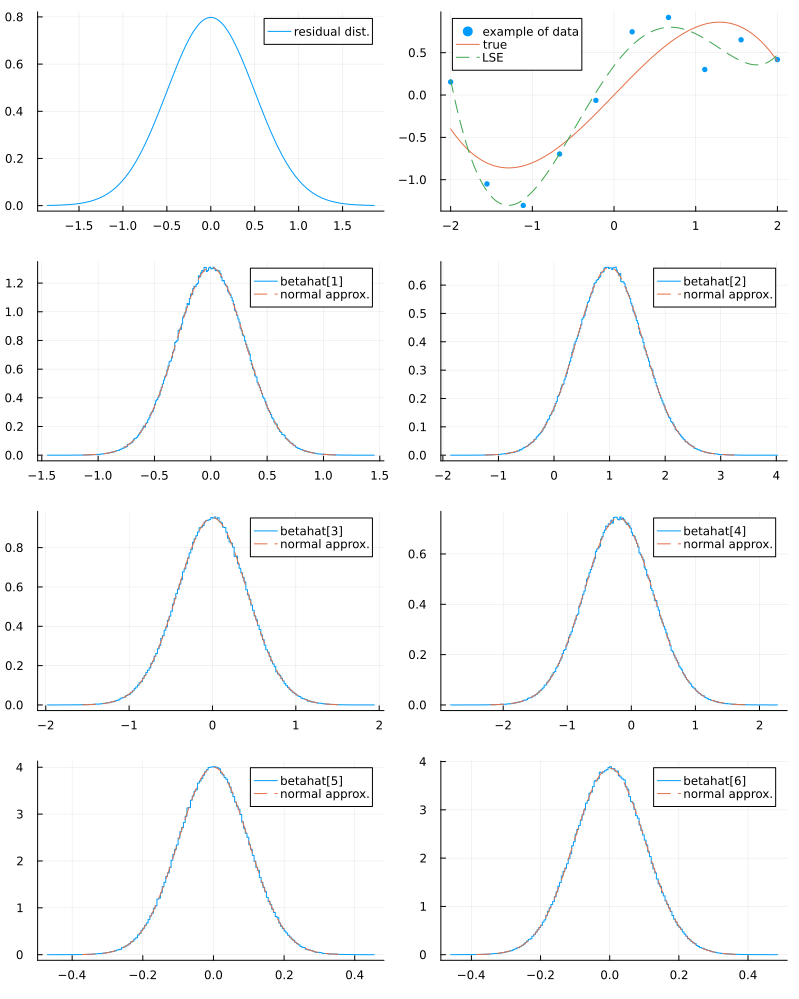

In [4]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 5
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0005056, 0.9999, 9.344e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.239, 0.3213, 0.1101, 0.1025]

n = 10
d = 3


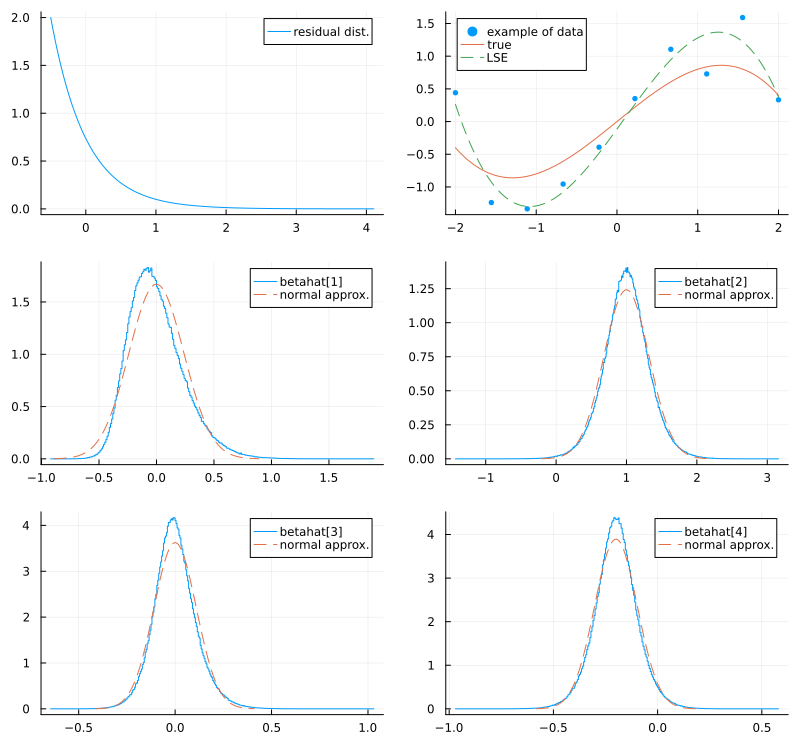

In [5]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001952, 0.9998, 4.773e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1679, 0.2322, 0.08505, 0.08069]

n = 20
d = 3


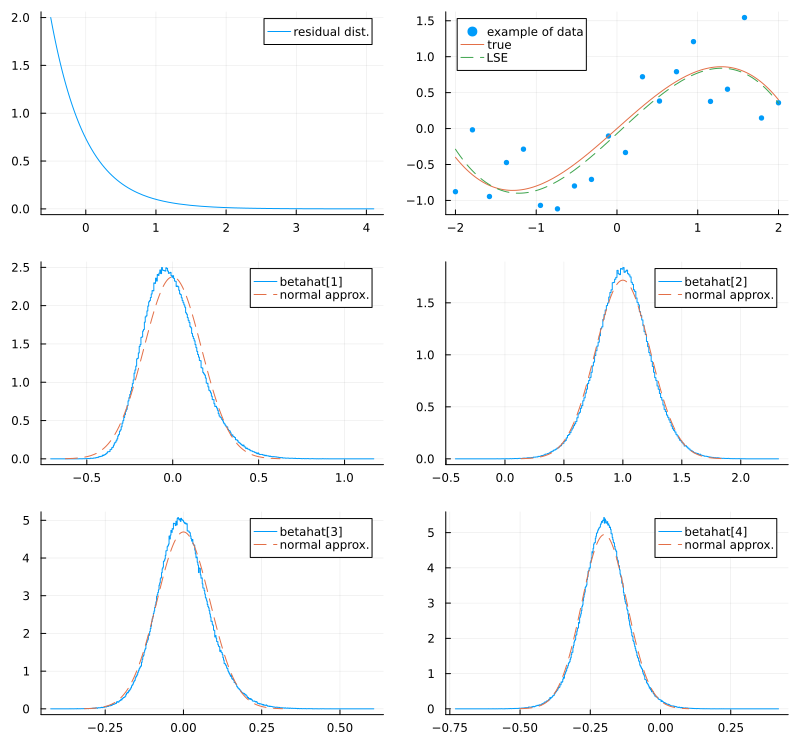

In [6]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-9.6e-5, 1.0, 1.5e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1186, 0.1673, 0.06309, 0.06085]

n = 40
d = 3


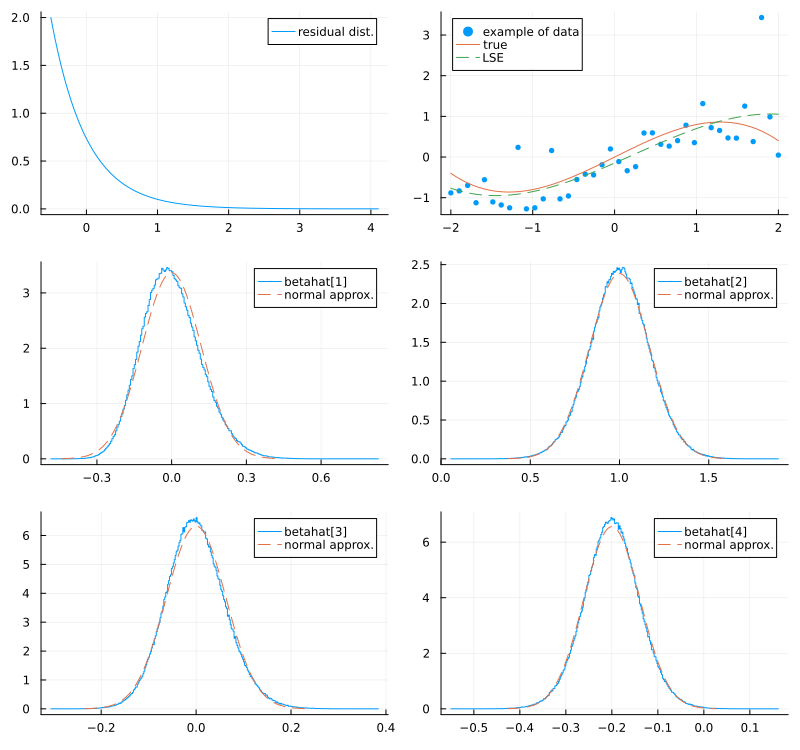

In [7]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001402, 1.001, 9.688e-5, -0.2002]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2389, 0.3207, 0.1101, 0.1024]

n = 10
d = 3


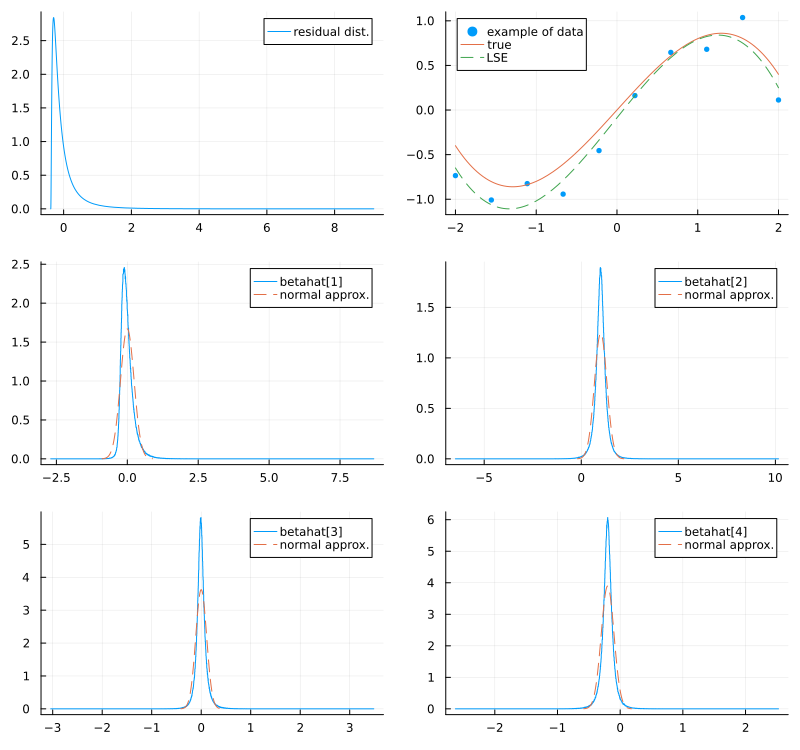

In [8]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [9.789e-5, 1.0, -5.021e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1684, 0.2324, 0.08525, 0.08079]

n = 20
d = 3


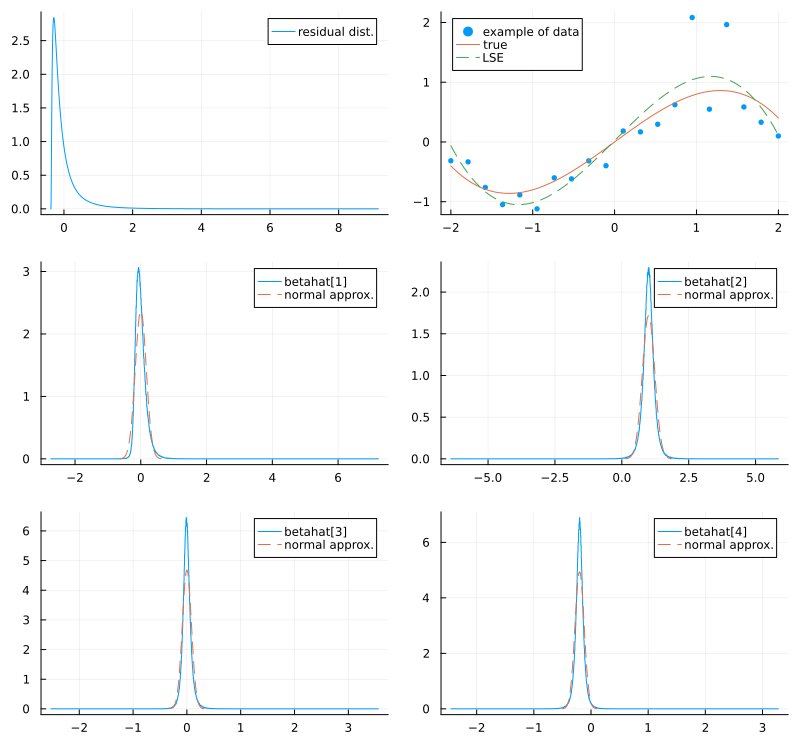

In [9]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [6.283e-5, 1.0, -9.483e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1185, 0.1672, 0.06309, 0.06086]

n = 40
d = 3


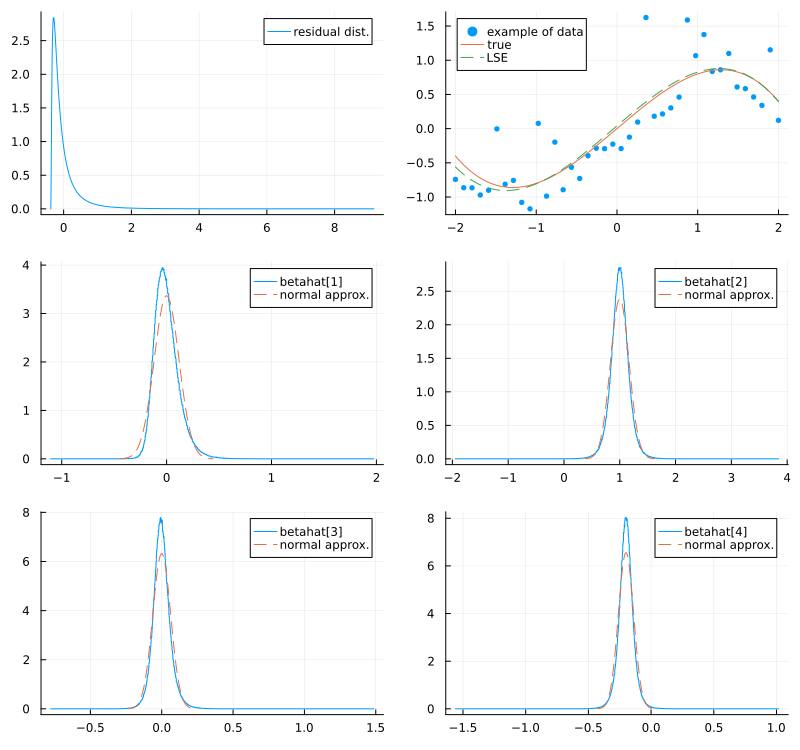

In [10]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-8.218e-6, 0.9997, -1.58e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08379, 0.1197, 0.04564, 0.04454]

n = 80
d = 3


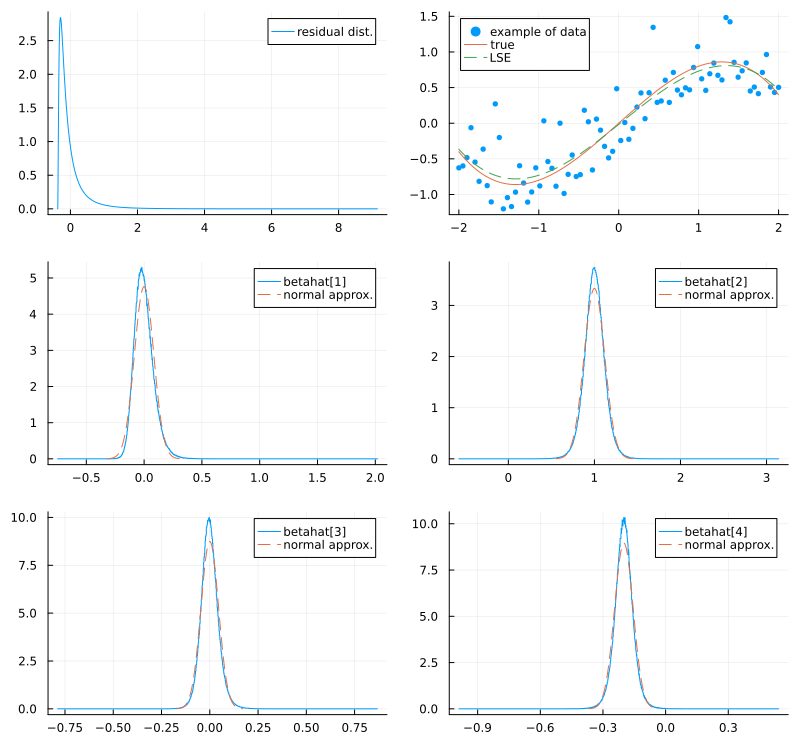

In [11]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-2.596e-5, 1.0, 2.188e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.05929, 0.08506, 0.03274, 0.03208]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.05921, 0.08513, 0.03272, 0.03211]

n = 160
d = 3


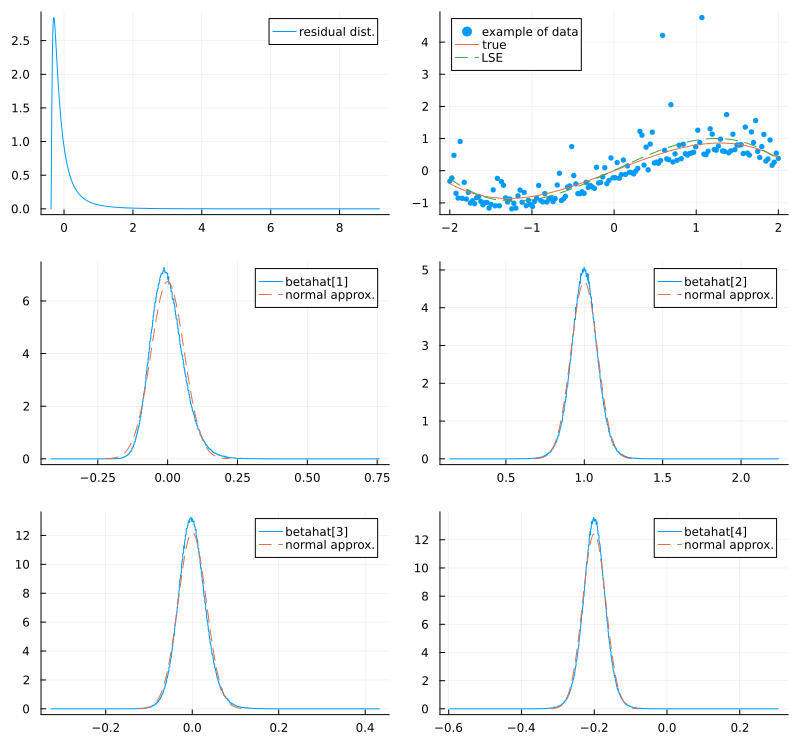

In [12]:
x = range(-2, 2, 160)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [1.212e-5, 0.9999, 1.419e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.04193, 0.06033, 0.02329, 0.0229]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.04196, 0.06037, 0.02331, 0.02292]

n = 320
d = 3


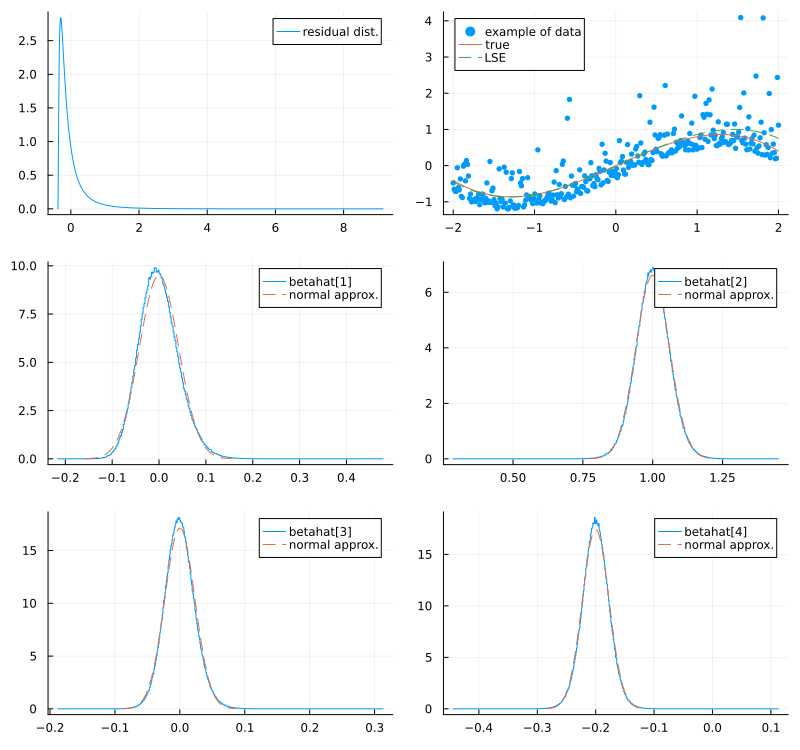

In [13]:
x = range(-2, 2, 320)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [6.412e-5, 0.9997, 3.712e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2391, 0.3214, 0.1102, 0.1025]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.049617
ECDF(pval[i, :], α) = 0.050368
ECDF(pval[i, :], α) = 0.049891
ECDF(pval[i, :], α) = 0.049882


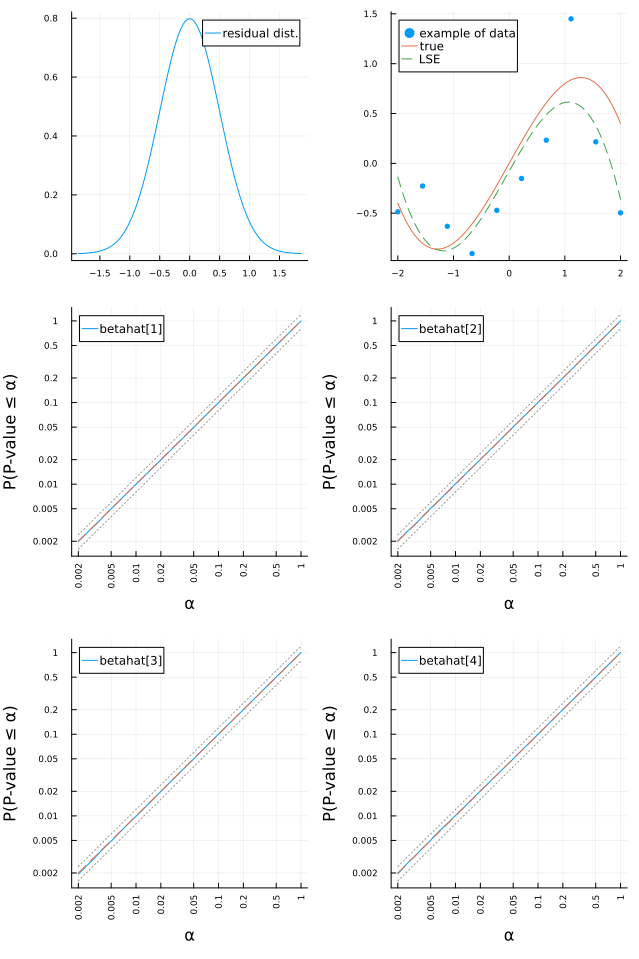

In [14]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-4.327e-5, 0.9998, -5.673e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2392, 0.3211, 0.1102, 0.1023]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.050167
ECDF(pval[i, :], α) = 0.737339
ECDF(pval[i, :], α) = 0.050037
ECDF(pval[i, :], α) = 0.375596


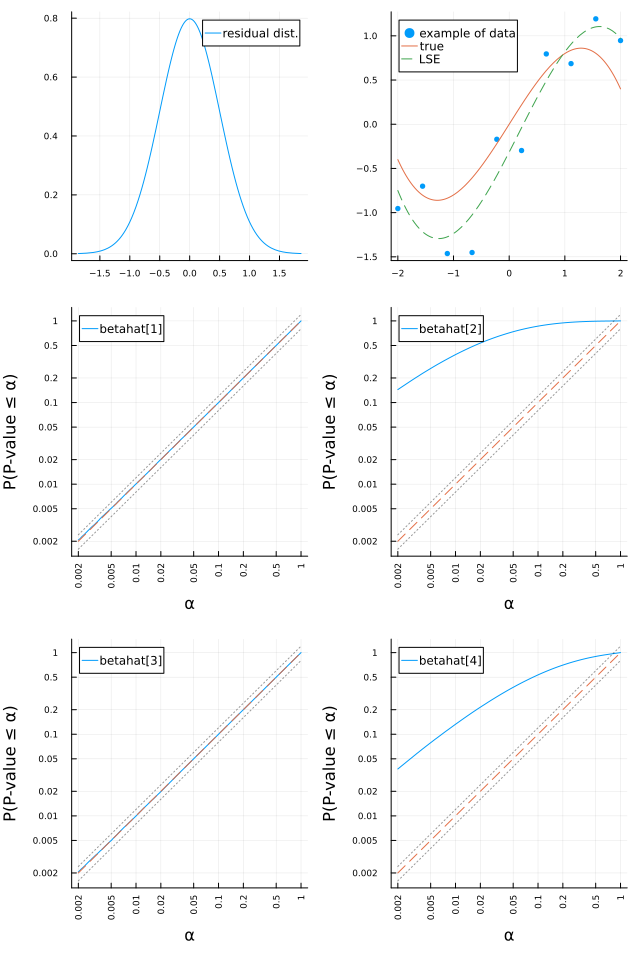

In [15]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0002364, 0.9997, 2.522e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.239, 0.3214, 0.1101, 0.1025]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.084303
ECDF(pval[i, :], α) = 0.042015
ECDF(pval[i, :], α) = 0.058887
ECDF(pval[i, :], α) = 0.052791


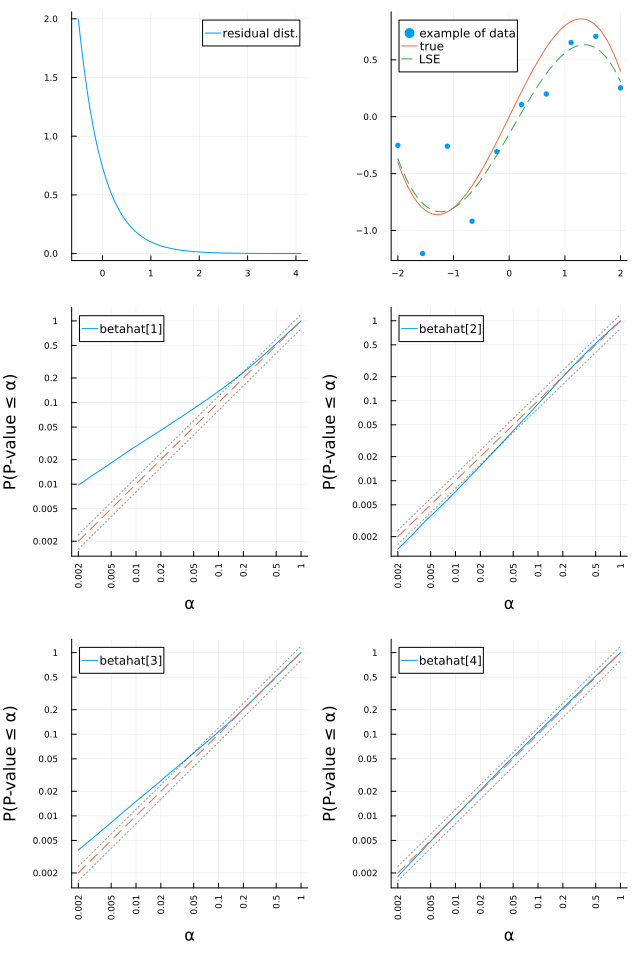

In [16]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [5.817e-5, 1.0, -7.723e-5, -0.2001]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2391, 0.3213, 0.1102, 0.1025]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.083696
ECDF(pval[i, :], α) = 0.774916
ECDF(pval[i, :], α) = 0.058892
ECDF(pval[i, :], α) = 0.474945


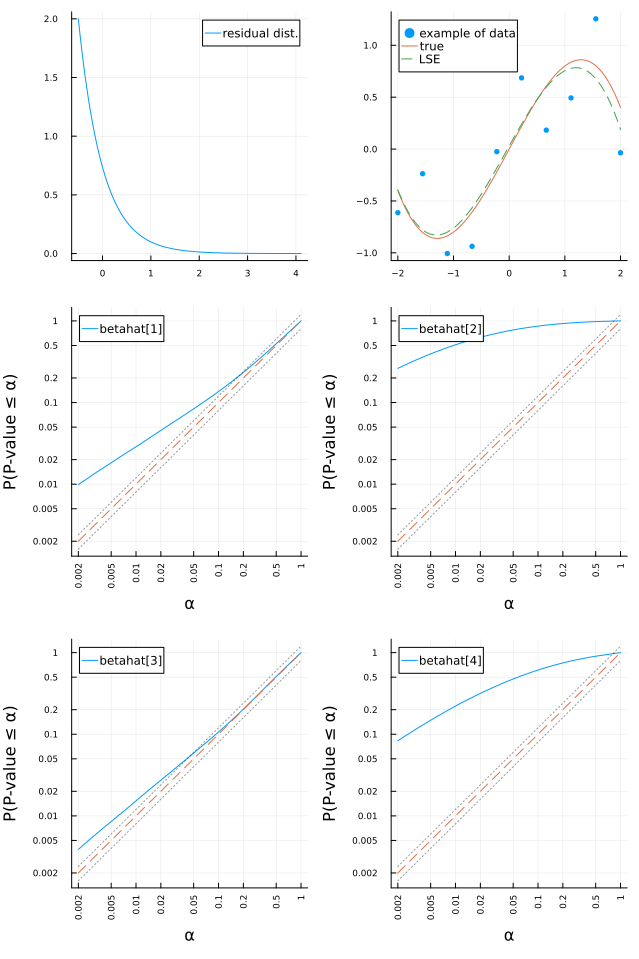

In [17]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001163, 1.0, -1.313e-5, -0.2001]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1679, 0.232, 0.08509, 0.08058]

n = 20
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.068062
ECDF(pval[i, :], α) = 0.04571
ECDF(pval[i, :], α) = 0.04994
ECDF(pval[i, :], α) = 0.051178


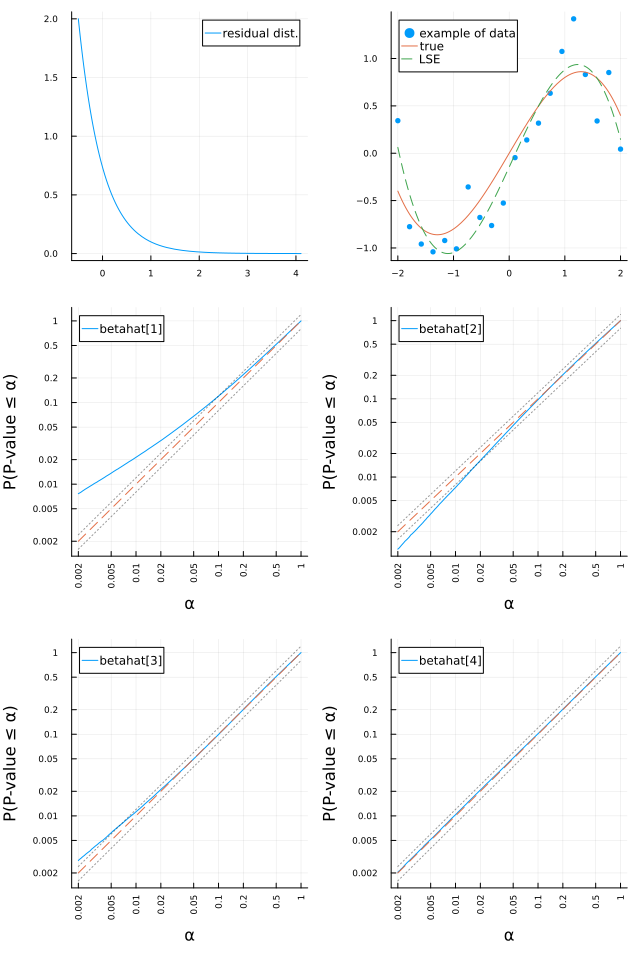

In [18]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [5.505e-5, 1.0, -3.635e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.168, 0.2322, 0.08512, 0.0806]

n = 20
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.067863
ECDF(pval[i, :], α) = 0.959753
ECDF(pval[i, :], α) = 0.049852
ECDF(pval[i, :], α) = 0.684766


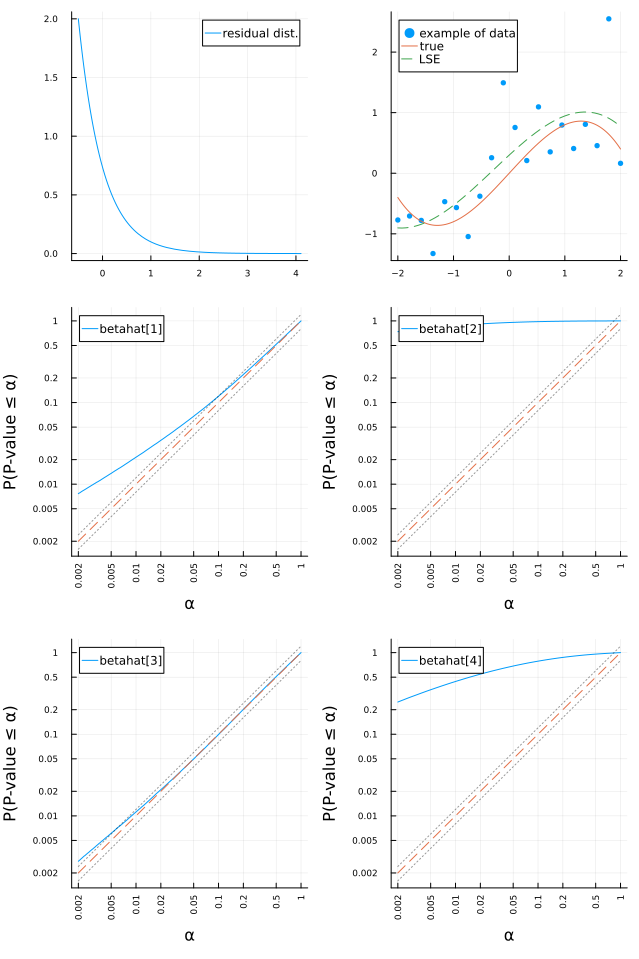

In [19]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0001583, 0.9999, -7.254e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1188, 0.1674, 0.06319, 0.06089]

n = 40
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.059054
ECDF(pval[i, :], α) = 0.047853
ECDF(pval[i, :], α) = 0.048754
ECDF(pval[i, :], α) = 0.050088


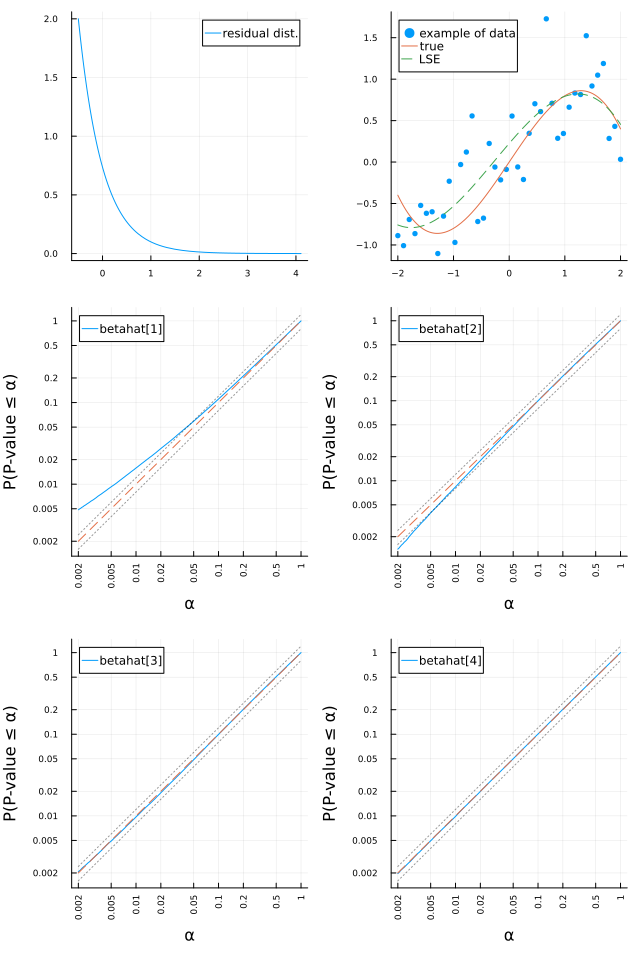

In [20]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0002403, 1.0, -0.0001379, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1186, 0.1674, 0.0631, 0.06082]

n = 40
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.059373
ECDF(pval[i, :], α) = 0.998742
ECDF(pval[i, :], α) = 0.048595
ECDF(pval[i, :], α) = 0.884466


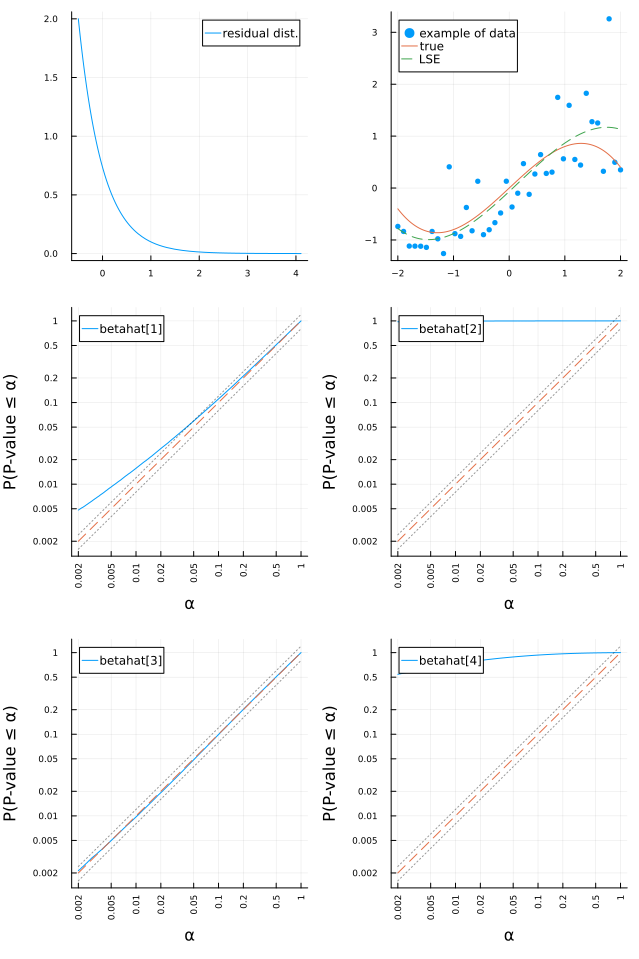

In [21]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.000145, 1.0, 4.778e-5, -0.2001]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08384, 0.1196, 0.04575, 0.0446]

n = 80
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.054951
ECDF(pval[i, :], α) = 0.048955
ECDF(pval[i, :], α) = 0.049236
ECDF(pval[i, :], α) = 0.049932


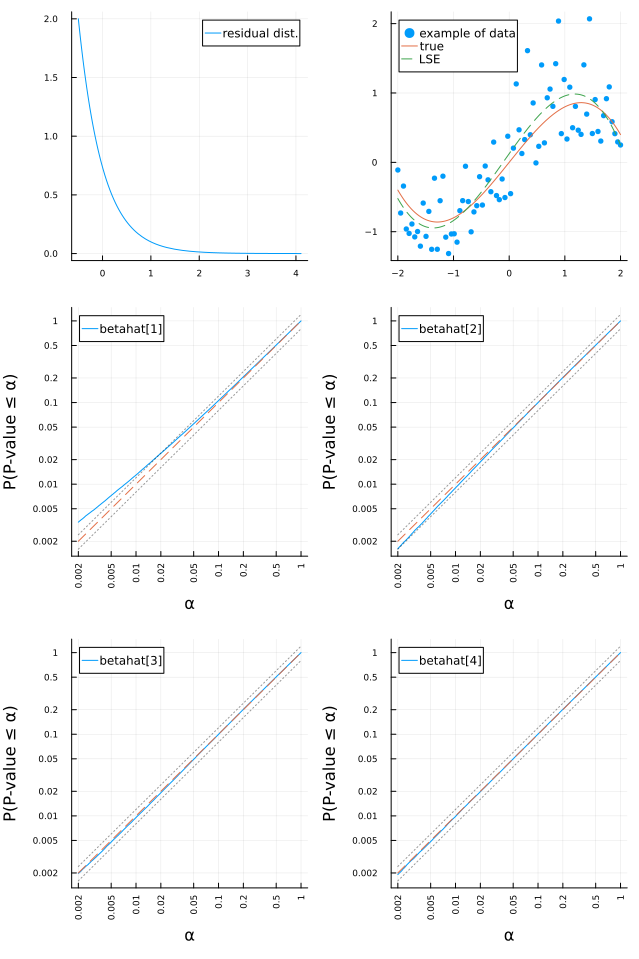

In [22]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [5.811e-5, 1.0, -5.217e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08395, 0.1197, 0.04573, 0.04458]

n = 80
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.055102
ECDF(pval[i, :], α) = 1.0
ECDF(pval[i, :], α) = 0.049346
ECDF(pval[i, :], α) = 0.987834


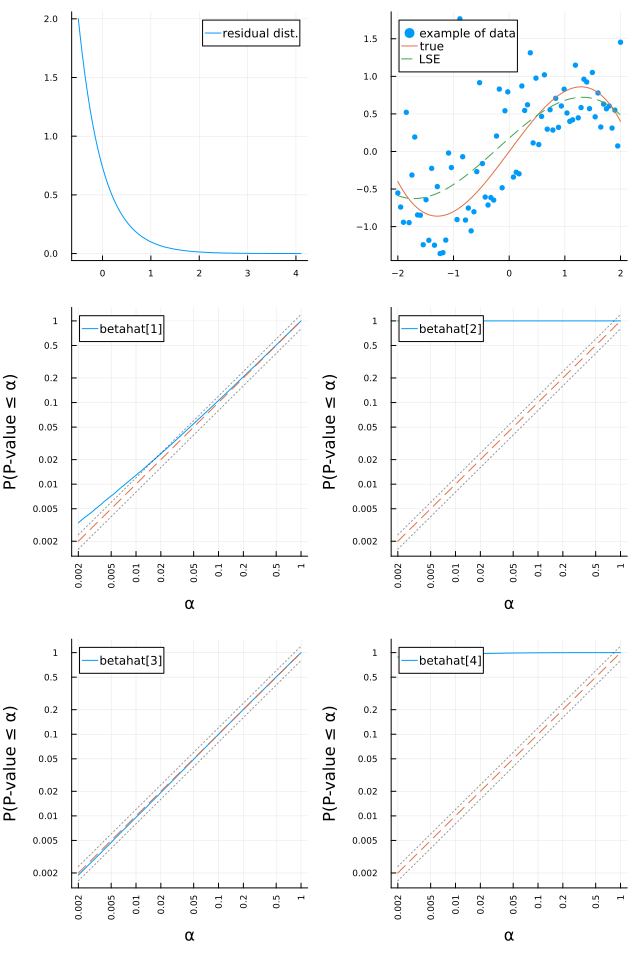

In [23]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [6.547e-5, 1.0, -0.0001369, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1189, 0.1673, 0.06317, 0.06085]

n = 40
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.080346
ECDF(pval[i, :], α) = 0.042539
ECDF(pval[i, :], α) = 0.047365
ECDF(pval[i, :], α) = 0.049367


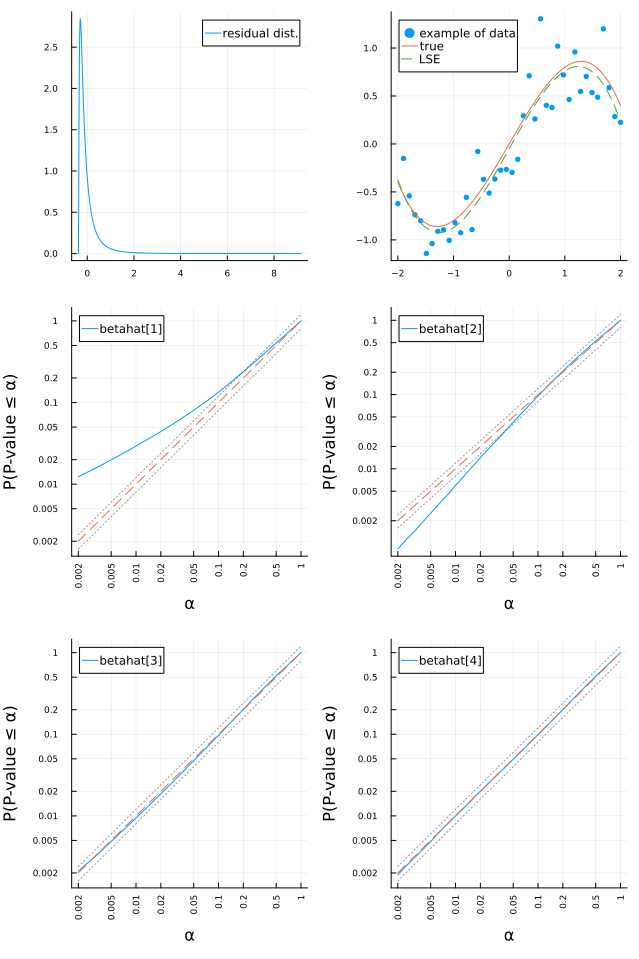

In [24]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001742, 0.9999, 3.928e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08374, 0.1196, 0.04574, 0.04455]

n = 80
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.068266
ECDF(pval[i, :], α) = 0.044873
ECDF(pval[i, :], α) = 0.046724
ECDF(pval[i, :], α) = 0.048339


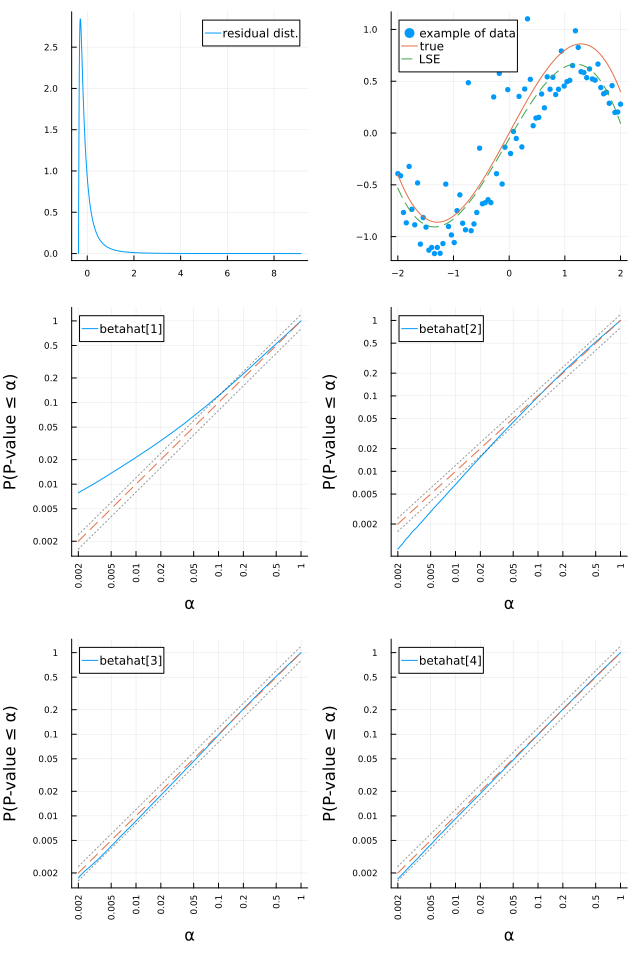

In [25]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [6.338e-7, 1.0, -2.189e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.05929, 0.08506, 0.03274, 0.03208]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.05938, 0.08516, 0.03278, 0.03211]

n = 160
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.061353
ECDF(pval[i, :], α) = 0.047203
ECDF(pval[i, :], α) = 0.048058
ECDF(pval[i, :], α) = 0.049143


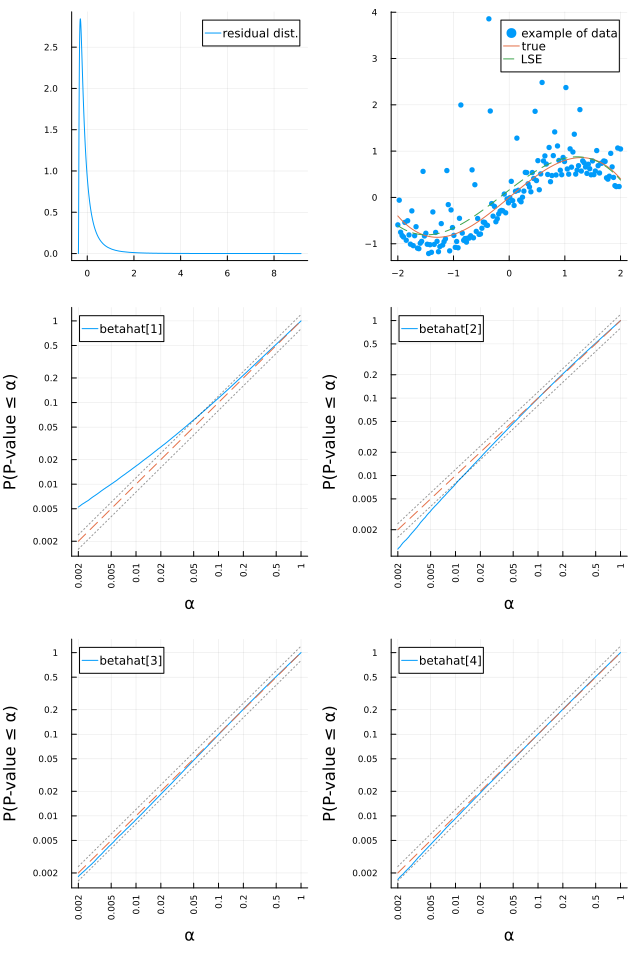

In [26]:
x = range(-2, 2, 160)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-2.752e-5, 1.0, 2.025e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.04193, 0.06033, 0.02329, 0.0229]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.04188, 0.06028, 0.02326, 0.02288]

n = 320
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.056108
ECDF(pval[i, :], α) = 0.047866
ECDF(pval[i, :], α) = 0.048582
ECDF(pval[i, :], α) = 0.048972


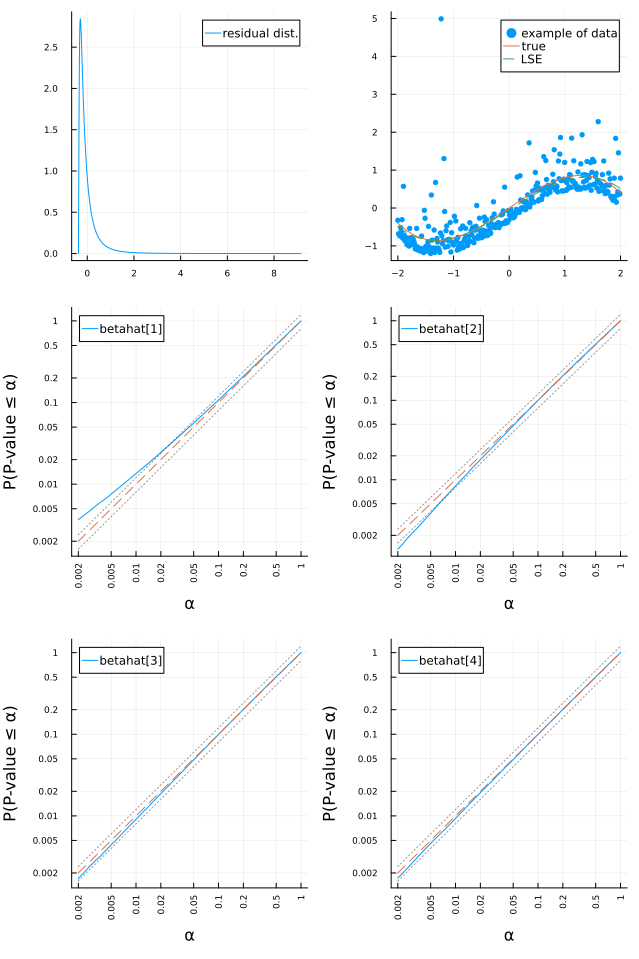

In [27]:
x = range(-2, 2, 320)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)